In [1]:
# Libraries
library(Seurat)
library(SeuratHelper)
library(stringr)
library(ggplot2)
library(readxl)

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, were retired in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.

Attaching SeuratObject



In [2]:
# Variables
in_file <- "../data/BCB/filtered_feature_bc_matrix.h5"
in_aggr_csv <- "../data/BCB/aggregation.csv"
url_markers <- "https://syncandshare.desy.de/index.php/s/B4PDcHA8Jg8zZBm"
url_markers <- paste0(url_markers, "/download")
in_markers <- "../docs/celltype/markers.xlsx"
url_overview <- "https://syncandshare.desy.de/index.php/s/CrDgDwHRQNDWYcj"
url_overview <- paste0(url_overview, "/download")
in_overview <- "../docs/overview.xlsx"
plot_dir <- "../analysis/BCB/"
out_file <- "../data/BCB/seurat.Rds"

In [3]:
# Download data
download.file(url_markers, in_markers)
download.file(url_overview, in_overview)

In [4]:
# Read data
aggr_csv <- read.csv(in_aggr_csv)
sheets <- excel_sheets(in_markers)
markers <- list()
for (i in sheets) {
    markers[[i]] <- read_excel(in_markers, i)
}
sheets <- excel_sheets(in_overview)
overview <- list()
for (i in sheets) {
    overview[[i]] <- read_excel(in_overview, i)
}

New names:
• `` -> `...3`
• `` -> `...4`
New names:
• `` -> `...3`
New names:
• `` -> `...4`
• `` -> `...5`


In [5]:
# Read data
mtx <- Read10X_h5(in_file)
mtx

Genome matrix has multiple modalities, returning a list of matrices for this genome

  [[ suppressing 32 column names ‘AAACCCAGTTCCGTTC-1’, ‘AAACCCAGTTGGAGAC-1’, ‘AAACCCATCACCATCC-1’ ... ]]

  [[ suppressing 32 column names ‘AAACCCAGTTCCGTTC-1’, ‘AAACCCAGTTGGAGAC-1’, ‘AAACCCATCACCATCC-1’ ... ]]

  [[ suppressing 32 column names ‘AAACCCAGTTCCGTTC-1’, ‘AAACCCAGTTGGAGAC-1’, ‘AAACCCATCACCATCC-1’ ... ]]

  [[ suppressing 33 column names ‘AAACCCAGTTCCGTTC-1’, ‘AAACCCAGTTGGAGAC-1’, ‘AAACCCATCACCATCC-1’ ... ]]



$`Gene Expression`
36606 x 342470 sparse Matrix of class "dgCMatrix"
                                                                                          
MIR1302-2HG   . .  . . .  . .  .  .  . . . . .   .  .  .  . .  .  .   .  .  .  . .  . .  .
FAM138A       . .  . . .  . .  .  .  . . . . .   .  .  .  . .  .  .   .  .  .  . .  . .  .
OR4F5         . .  . . .  . .  .  .  . . . . .   .  .  .  . .  .  .   .  .  .  . .  . .  .
AL627309.1    . .  . . .  . .  .  .  . . . . .   .  .  .  . .  .  .   .  .  .  . .  . .  .
AL627309.3    . .  . . .  . .  .  .  . . . . .   .  .  .  . .  .  .   .  .  .  . .  . .  .
AL627309.2    . .  . . .  . .  .  .  . . . . .   .  .  .  . .  .  .   .  .  .  . .  . .  .
AL627309.5    . .  . . .  . .  .  .  . . . . .   .  .  .  . .  .  .   .  .  .  . .  . .  .
AL627309.4    . .  . . .  . .  .  .  . . . . .   .  .  .  . .  .  .   .  .  .  . .  . .  .
AP006222.2    . .  . . .  . .  .  .  . . . . .   .  .  .  . .  .  .   .  .  .  . .  . .  .
AL732372.1    . .  . 

In [6]:
# Create Seurat object
hto <- mtx[['Antibody Capture']]
counts <- mtx[['Gene Expression']]
rownames(counts) <- make.unique(rownames(counts), sep="-")
ds <- CreateSeuratObject(counts, "BCB")
ds[["HTO"]] <- CreateAssayObject(hto)
ds

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


An object of class Seurat 
36620 features across 342470 samples within 2 assays 
Active assay: RNA (36606 features, 0 variable features)
 1 other assay present: HTO

In [7]:
# Add meta data
index <- str_split(colnames(ds), "-", simplify=TRUE)[, 2]
ds$libname <- factor(aggr_csv[index, ][, 1])

In [8]:
# Add meta data
names(overview)
index <- !is.na(overview$libraries$run)
data <- overview$libraries[index, ]
ds@meta.data <- cbind(ds@meta.data, data[match(ds$libname, data$libname), ])

[1] "libraries"    "patients"     "samples"      "examinations" "hto_features"
[6] "hto_indices"

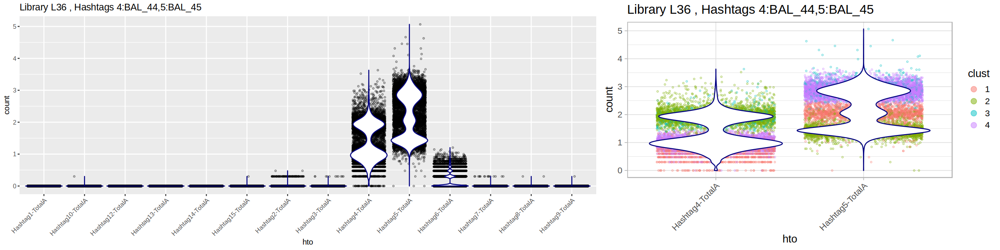

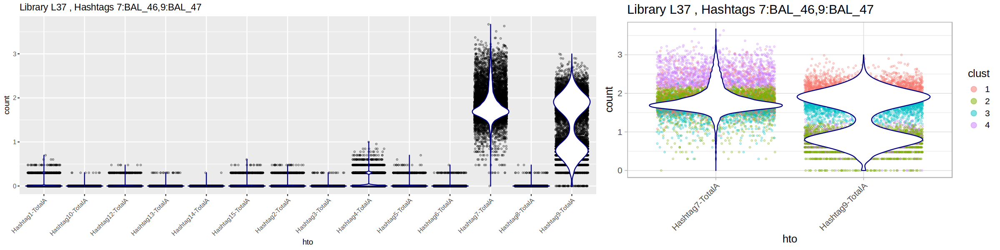

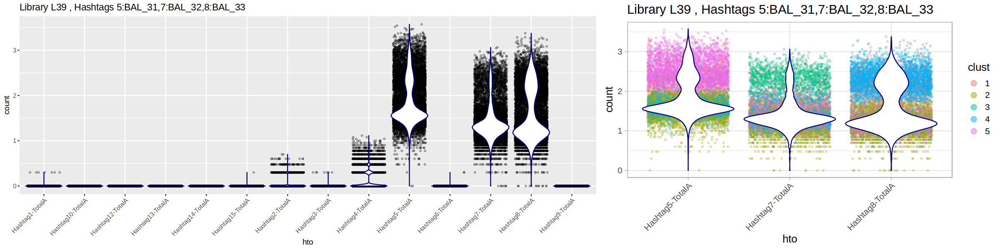

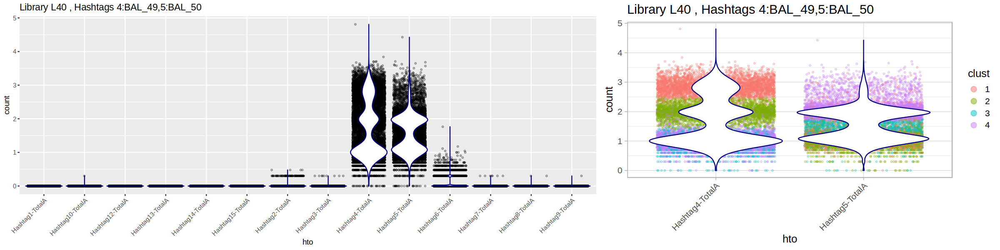

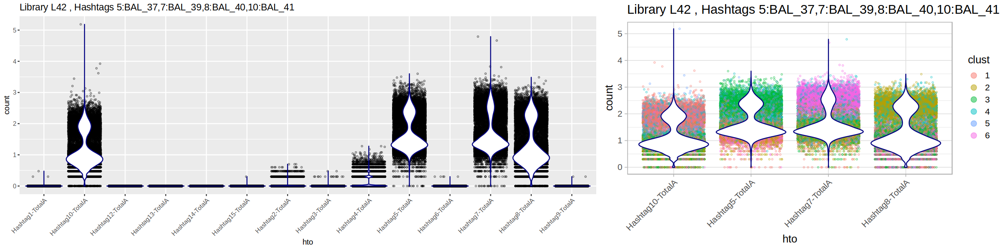

In [11]:
# De-multiplex samples from libraries
options(repr.plot.width=20, repr.plot.height=5)
set.seed(42)
ind <- data$libname[which(!is.na(data[["TotalSeq-A"]]))]
ds$hto_clust <- "None"
for (i in ind) {
    index <- data$sample[data$libname == i]
    index <- stringr::str_split(index, ",", simplify = TRUE)[1, ]
    
    index <- stringr::str_split(index, ":", simplify = TRUE)
    index <- as.data.frame(index)
    colnames(index) <- c("Hashtag", "Sample")
    index$Hashtag <- paste0("Hashtag", index$Hashtag, "-TotalA")
    
    # Sample overview
    cells <- colnames(ds)[ds$libname == i]
    df <- as.data.frame(t(as.matrix(ds[["HTO"]]@counts[, cells])))
    df <- log10(df+1)
    df <- tidyr::gather(df, "hto", "count")
    
    p <- ggplot2::ggplot(df, ggplot2::aes(hto, count)) +
      ggplot2::geom_point(position = "jitter", size=.5, shape = 21, alpha = .5) +
      ggplot2::geom_violin(scale = "width", col = "navy") +
            ggplot2::labs(title = paste0("Library ", i, " , Hashtags ", data$sample[data$libname == i])) +
      ggplot2::theme(
        axis.text.x = ggplot2::element_text(angle = 45, hjust=1, vjust=1)
      )
    fn <- paste0(plot_dir, "qc/", "demux", "_", i, ".", "png")
    ggplot2::ggsave(fn, p, width = 12, height = 6)

    # Barcode clusters
    df <- as.data.frame(t(as.matrix(ds[["HTO"]]@counts[index$Hashtag, cells])))
    df <- as.data.frame(log10(df+1))
    df$clust <- factor(kmeans(df, nrow(index)+2)$cluster)
    ds$hto_clust[ds$libname == i] <- paste0(i, ":", as.character(df$clust))
    df$bc <- row.names(df)
    df <- tidyr::gather(df, "hto", "count", -clust, -bc)
    
    p2 <- ggplot2::ggplot(df, ggplot2::aes(hto, count, col = clust)) +
      ggplot2::geom_point(position = "jitter", size=.5, shape = 21, alpha = .5) +
      ggplot2::geom_violin(scale = "width", col = "navy") +
      ggplot2::labs(title = paste0("Library ", i, " , Hashtags ", data$sample[data$libname == i])) +
      ggplot2::theme_light(15) +
      ggplot2::theme(
        axis.text.x = ggplot2::element_text(angle = 45, hjust=1, vjust=1)
      ) +
      ggplot2::guides(
        color = ggplot2::guide_legend(override.aes = list(size=5, shape=20))
      )
    fn <- paste0(plot_dir, "qc/", "demux", "_", i, "_", "clusters", ".", "png")
    ggplot2::ggsave(fn, p2, width = 6, height = 6)

    print(cowplot::plot_grid(p, p2, rel_widths = c(1.5, 1)))
}

[1] "None"  "L36:2" "L36:1" "L36:4" "L36:3" "L37:2" "L37:1" "L37:3" "L37:4"
[10] "L39:4" "L39:5" "L39:1" "L39:3" "L39:2" "L40:1" "L40:2" "L40:4" "L40:3"
[19] "L42:1" "L42:6" "L42:3" "L42:2" "L42:4" "L42:5"

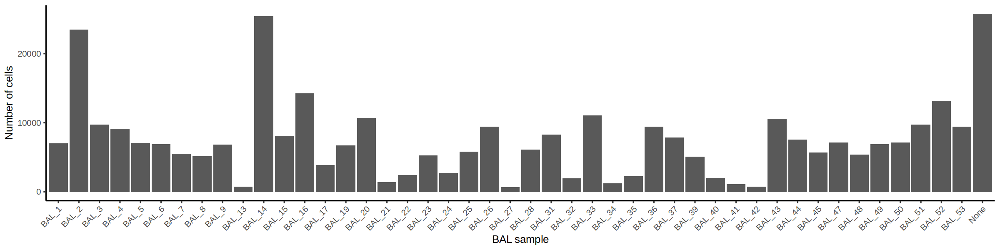

In [13]:
unique(ds$hto_clust)
hto_class <- c(
    "L36:1" = "BAL_44",
    "L36:2" = "BAL_44",
    "L36:3" = "BAL_45",
    "L36:4" = "BAL_45",
    "L37:1" = "BAL_47",
    "L37:2" = "None",
    "L37:3" = "BAL_47",
    "L37:4" = "None",
    "L39:1" = "None",
    "L39:2" = "None",
    "L39:3" = "BAL_32",
    "L39:4" = "BAL_33",
    "L39:5" = "BAL_31",
    "L40:1" = "None",
    "L40:2" = "BAL_49",
    "L40:3" = "BAL_49",
    "L40:4" = "BAL_50",
    "L42:1" = "None",
    "L42:2" = "None",
    "L42:3" = "BAL_37",
    "L42:4" = "BAL_40",
    "L42:5" = "BAL_41",
    "L42:6" = "BAL_39"
)
index <- which(ds$hto_clust != "None")
ds$sample[index] <- hto_class[ds$hto_clust[index]]
df <- as.data.frame(table(ds$sample))
df$num <- as.numeric(str_split(df$Var1, "_", simplify = TRUE)[,2])
df <- df[order(df$num), ]
df$Var1 <- factor(df$Var1, unique(df$Var1))
ggplot(df, aes(Var1, Freq)) + geom_col() + theme_classic(15) + theme(axis.text.x = element_text(angle=45, hjust=1, vjust=1)) +
labs(x = "BAL sample", y = "Number of cells")

In [14]:
# Assign sample data
data <- overview$samples
index <- match(ds$sample, data$sample)
for (i in c("patient", "cohort", "disease", "dpso", "type", "who_scale", "severity")) {
    ds@meta.data[[i]] <- data[[i]][index]
}

In [15]:
# Assign patient data
data <- overview$patients
index <- match(ds$patient, data$id)
ds@meta.data <- cbind(ds@meta.data, data[index, ])

In [16]:
# Quality control - Metrics
ds <- add_qc_metrics(ds)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”


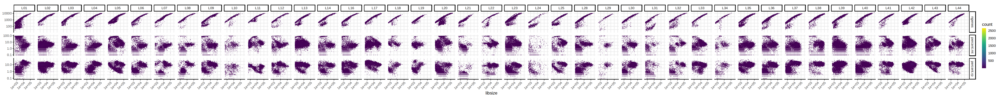

In [17]:
# Plot
options(repr.plot.width=50, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "libname", split_by_max = 50)
fn <- paste0(plot_dir, "qc_lib", ".", "png")
ggsave(fn, width = 50, height = 5, bg="white", limitsize = FALSE)

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 17123500)”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”


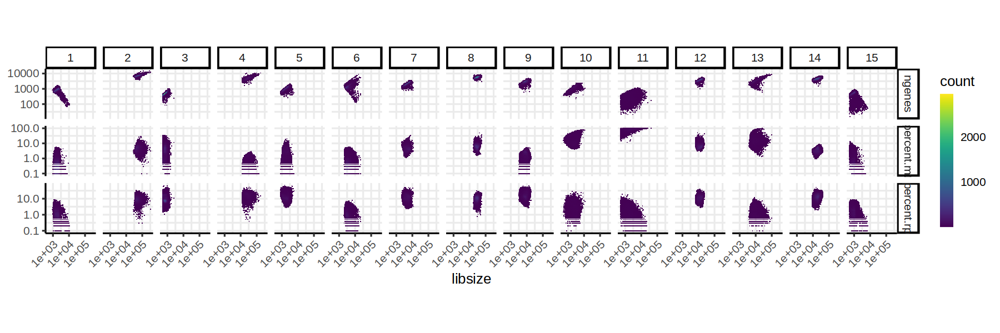

In [18]:
# Quality control - Clusters
set.seed(42)
df <- ds@meta.data[, c("libsize", "ngenes", "percent.mt", "percent.rp")]
df <- log1p(df)
ds$qc_cluster <- factor(kmeans(df, centers = 15)$cluster)

# Plot
options(repr.plot.width=15, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "qc_cluster", split_by_max = 15)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”


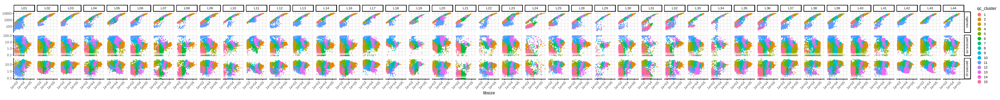

In [19]:
# Plot
options(repr.plot.width=50, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "libname", color_by = "qc_cluster", split_by_max = 50)
fn <- paste0(plot_dir, "qc_lib-cluster", ".", "png")
ggsave(fn, width = 50, height = 5, bg="white", limitsize = FALSE)

,libsize,ngenes,percent.mt,percent.rp
,<dbl>,<dbl>,<dbl>,<dbl>
1,689.58,321.64,0.59,0.89
2,21257.65,2750.87,2.19,3.97
3,275.82,191.71,1.89,4.08
4,11185.77,1878.87,0.67,6.22
5,691.19,399.81,1.41,5.43
6,1506.79,530.83,0.63,0.86
7,1812.75,813.71,2.21,5.19
8,10976.14,2138.52,2.77,4.26
9,3086.12,1071.06,1.04,6.49


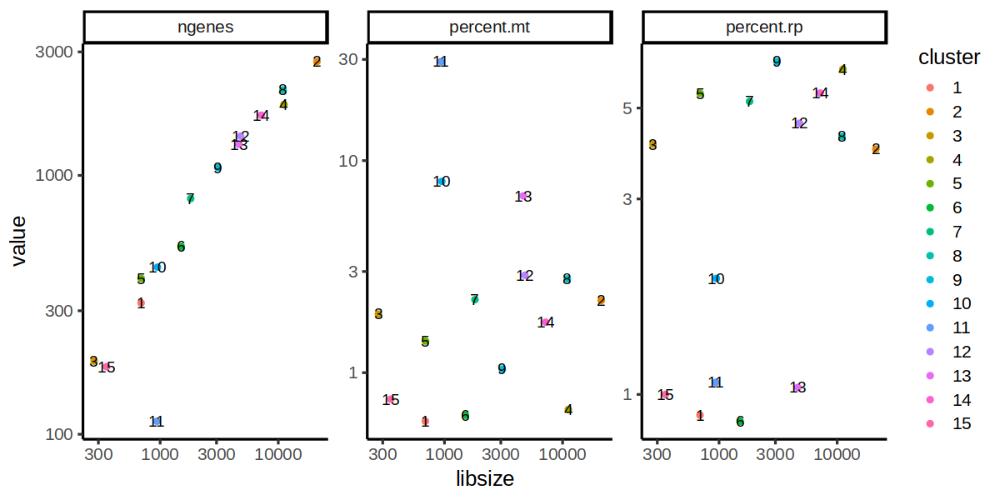

In [20]:
# Quality control - Classification
data <- as.data.frame(t(summarize_groups(t(as.matrix(exp(df-1))), ds$qc_cluster)))
data <- round(data, 2)
ds$quality <- "Good"
ds$quality[ds$qc_cluster %in% rownames(data)[which(data$percent.mt > 5)]] <- "Bad"
ds$quality <- factor(ds$quality)

# Plot
options(repr.plot.width=10, repr.plot.height=5)
data
data$cluster <- row.names(data)
data$cluster <- factor(data$cluster, sort(unique(as.numeric(data$cluster))))
data <- tidyr::gather(data, "metric", "value", -libsize, -cluster)
ggplot(data, aes(libsize, value, label = cluster, col = cluster)) +
geom_point() +
geom_text(col = "black") +
facet_wrap(~metric, scales = "free_y") +
theme_classic(15) +
scale_x_continuous(trans = "log10") +
scale_y_continuous(trans = "log10")

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5476 rows containing non-finite values (`stat_bin2d()`).”


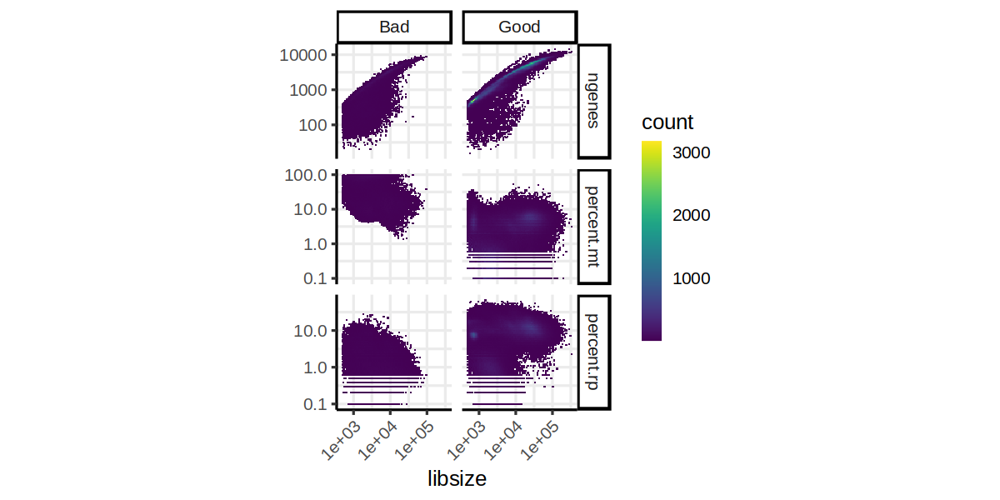

In [21]:
# Plot
options(repr.plot.width=10, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "quality")
fn <- paste0(plot_dir, "qc_quality", ".", "png")
ggsave(fn, width = 6, height = 6, bg="white", limitsize = FALSE)

In [22]:
# Quality control - Filter
cells <- colnames(ds)[which(!ds$quality == "Bad")]
paste("Removing", (1-round(length(cells) / ncol(ds), 4))*100, "% of cells")
ds <- subset(ds, cells = cells)

[1] "Removing 8.47 % of cells"

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5429 rows containing non-finite values (`stat_bin2d()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5429 rows containing non-finite values (`stat_bin2d()`).”


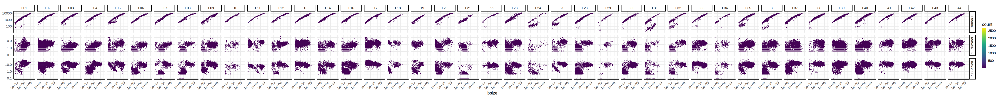

In [23]:
# Plot
options(repr.plot.width=50, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "libname", split_by_max = 50)
fn <- paste0(plot_dir, "qc_lib-filtered", ".", "png")
ggsave(fn, width = 50, height = 5, bg="white", limitsize = FALSE)

In [24]:
# Transform data
ds <- NormalizeData(ds)
ds <- FindVariableFeatures(ds)
ds <- ScaleData(ds)
ds <- RunPCA(ds)

Centering and scaling data matrix

PC_ 1 
Positive:  SKAP1, CD96, SYNE2, CD2, IL32, BCL11B, THEMIS, FYN, ETS1, SLFN12L 
	   IKZF3, CD247, CCL5, FUT8, CARD11, INPP4B, TRAC, ITK, SLC38A1, GZMA 
	   TC2N, PPP1R16B, CAMK4, PRKCQ, C12orf75, TRBC2, KLF12, RORA, TSPAN5, PYHIN1 
Negative:  S100A9, APOE, FN1, FABP4, CCL18, LSAMP, INHBA, CTSL, SCD, MME 
	   RETN, S100A8, AC092691.1, SPRED1, FABP3, HMOX1, CES1, APOC2, TPRG1, MIR3945HG 
	   RBP4, TRHDE, TGM2, FMN1, IL1RN, ANO5, IFIT2, RTN1, VCAN, IL1R2 
PC_ 2 
Positive:  CD2, SKAP1, IL32, CD96, THEMIS, CCL5, BCL11B, GZMA, TRAC, CD247 
	   SLFN12L, FYN, ETS1, IKZF3, TRBC2, ITK, PRKCQ, CAMK4, CARD11, PPP1R16B 
	   GRAP2, PYHIN1, SAMD3, RUNX3, CORO1A, ADAM19, LINC01934, FUT8, SLC38A1, LINC01871 
Negative:  WFDC2, KRT8, ELF3, KRT19, TMC5, FXYD3, TSPAN1, PARD3, KRT18, CHST9 
	   EPCAM, ENAH, MUC4, MAPK10, MYH14, MUC16, FOXP2, TEAD1, SLC44A4, NEBL 
	   DSP, MECOM, AGR2, TACC2, SDK1, TACSTD2, TRIM2, AGR3, CLDN4, NFIB 
PC_ 3 
Positive:  MKI67, STMN1, TOP2

In [25]:
# Calculate embedding & clusters
dims <- 1:40
ds <- RunUMAP(ds, dims=dims, return.model = TRUE, verbose = FALSE)
ds <- FindNeighbors(ds, dims=dims)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
Computing nearest neighbor graph

Computing SNN



Warning message in plot_embedding(ds):
“Expression/metadata for '' not found.”


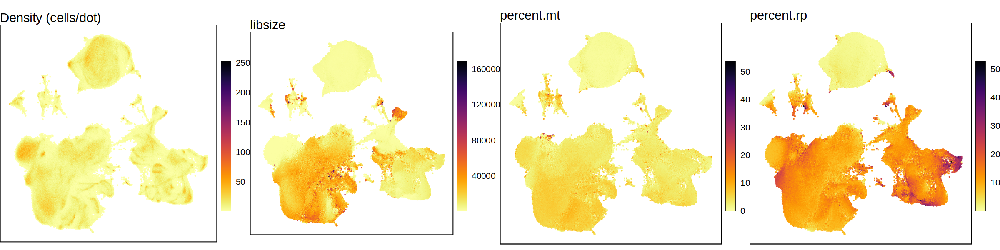

In [63]:
# Plot
options(repr.plot.width=20, repr.plot.height=5)
cowplot::plot_grid(
    plot_embedding(ds),
    plot_embedding(ds, "libsize"),
    plot_embedding(ds, "percent.mt"),
    plot_embedding(ds, "percent.rp"), nrow = 1
)

Quantiles for the number of genes detected by cell: 
(Non-detected genes are shuffled at the end of the ranking. Keep it in mind when choosing the threshold for calculating the AUC).



     min       1%       5%      10%      50%     100% 
   16.00   348.53   451.00   515.00  2622.00 14423.00 


Genes in the gene sets NOT available in the dataset: 
	Doublet: 	1 (20% of 5)

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from celltype.auc_ to celltypeauc_”


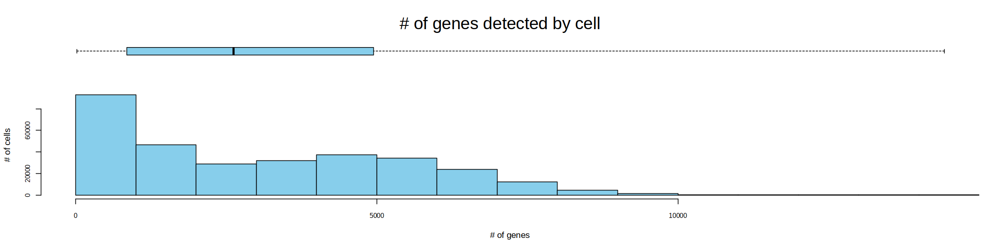

In [27]:
# Annotation - Cell type AUC
dict <- markers$celltype
gsets <- split(dict$gene, dict$type)
ds <- AddAUC(ds, gsets, "celltype.auc")

Warning message in plot_markers_embedding(ds, assay = "celltype.auc", scale = FALSE, :
“No markers specified. Defaulting to whole assay.”


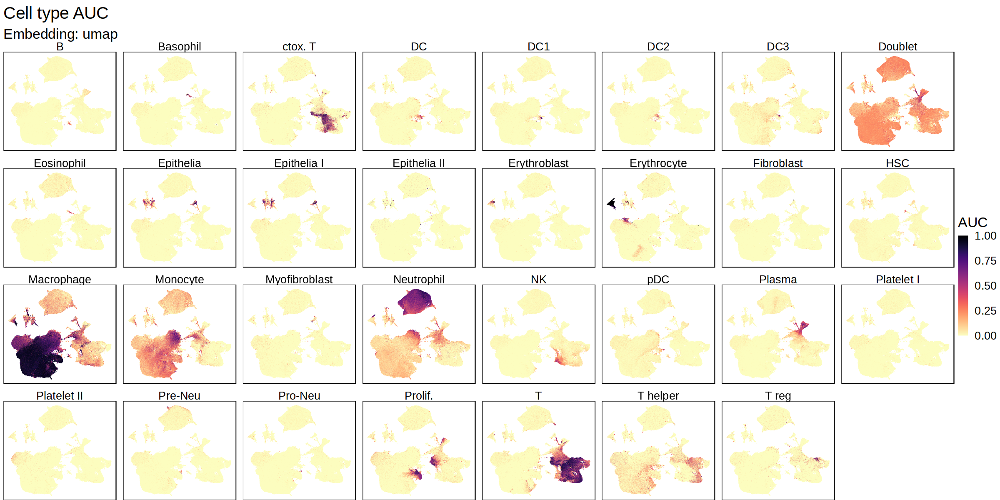

In [81]:
# Plot
options(repr.plot.width=20, repr.plot.height=10)
plot_markers_embedding(ds, assay = "celltype.auc", scale = FALSE, pt.size = .1, pt.stroke = .1, nrow = 4,
                       pl.title = "Cell type AUC", col.title = "AUC")
fn <- paste0(plot_dir, "pca-umap_celltype-markers-AUC", ".", "png")
ggsave(fn, width = 20, height = 10, bg="white", limitsize = FALSE)

In [84]:
# Plot
p <- plot_markers_embedding(ds, unlist(gsets))
fn <- paste0(plot_dir, "pca-umap_celltype-markers", ".", "png")
ggsave(fn, p, width = 20, height = 20, bg="white", limitsize = FALSE)

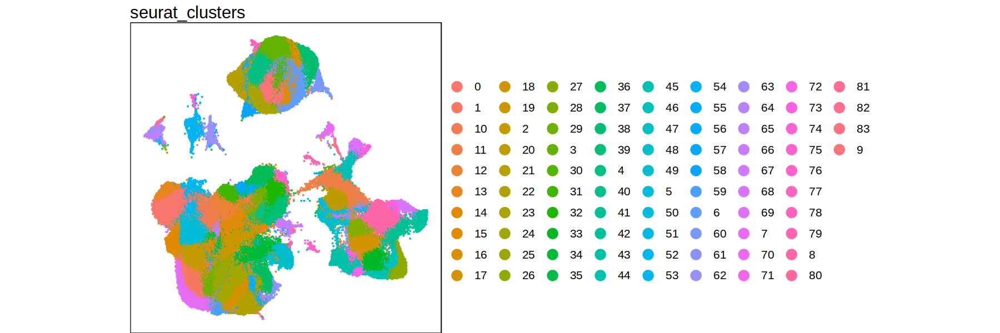

In [70]:
# Plot
options(repr.plot.width=15, repr.plot.height=5)
ds <- FindClusters(ds, resolution = 3)
plot_embedding(ds, "seurat_clusters")

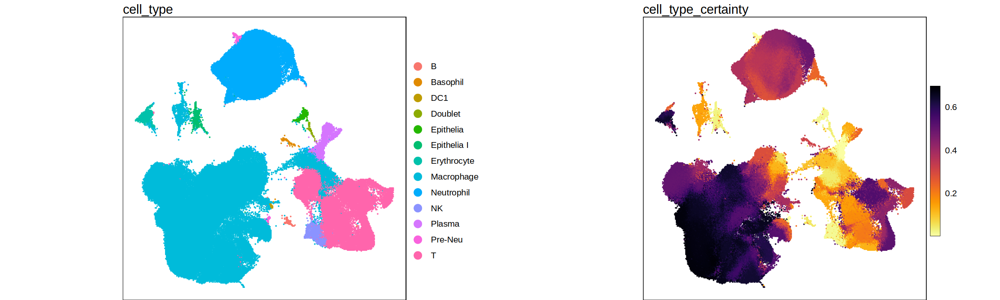

In [31]:
# Annotate
ds <- SeuratHelper::annotate_maxAUC(ds, assay = "celltype.auc")

# Plot
options(repr.plot.width=20, repr.plot.height=6)
cowplot::plot_grid(
    plot_embedding(ds, "cell_type", legend.rows = 1),
    plot_embedding(ds, "cell_type_certainty", pt.stroke = .1), rel_widths = c(1.5, 1)
    )

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5429 rows containing non-finite values (`stat_bin2d()`).”


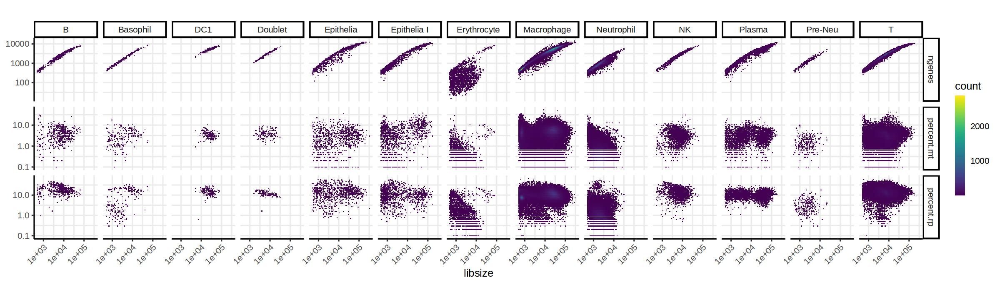

In [177]:
# Cell type QC
options(repr.plot.width=20, repr.plot.height=6)
plot_qc_metrics(ds, split_by = "cell_type", split_by_max = 20)

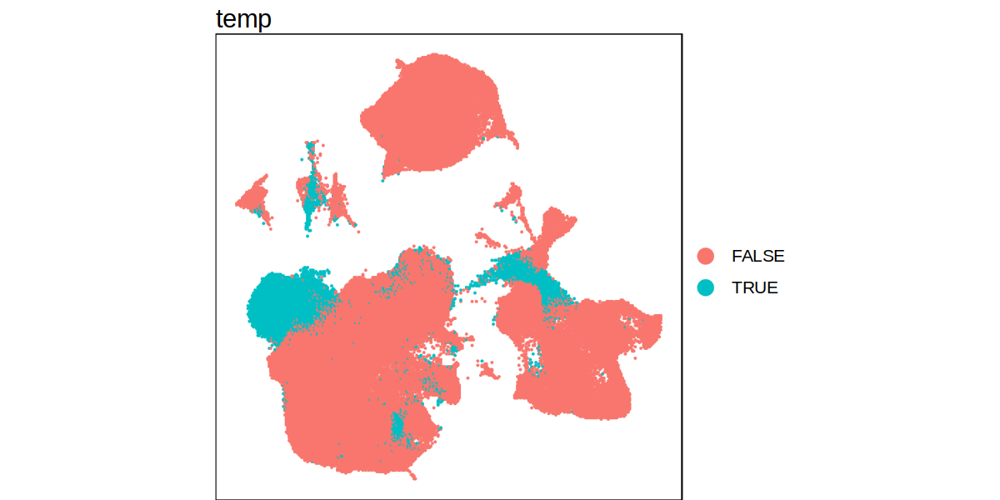

In [171]:
# Plot
options(repr.plot.width=10, repr.plot.height=5)
ds$temp <- ds$cell_type == "Macrophage" & ds$libsize < 3000
plot_embedding(ds, "temp")

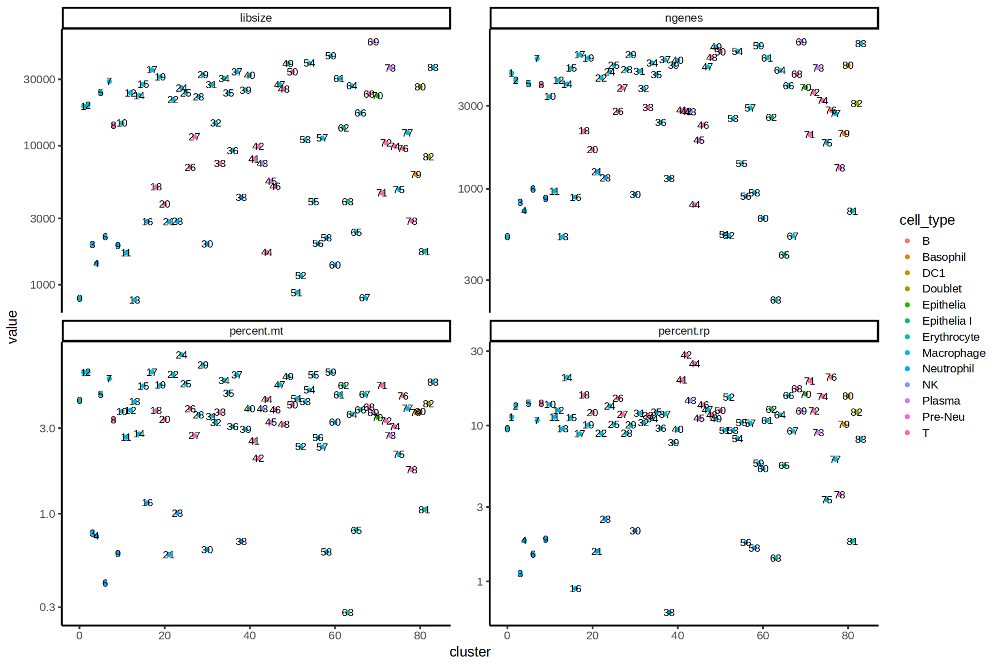

In [182]:
# Refine annotation
df <- ds@meta.data[, c("libsize", "ngenes", "percent.mt", "percent.rp")]
df <- t(summarize_groups(t(as.matrix(df)), ds$seurat_clusters))
df <- as.data.frame(round(df, 2))
df$cluster <- rownames(df)
data <- unique(ds@meta.data[, c("cell_type", "seurat_clusters")])
rownames(data) <- data$seurat_clusters
df$cell_type <- data[df$cluster, "cell_type"]
df$cluster <- as.numeric(df$cluster)

# Plot
options(repr.plot.width=15, repr.plot.height=10)
data <- tidyr::gather(df, "metric", "value", -cluster, -cell_type)
ggplot(data, aes(cluster, value, label = cluster, col = cell_type)) +
geom_point() +
geom_text(col = "black") +
facet_wrap(~metric, scales = "free_y") +
theme_classic(15) +
scale_y_continuous(trans = "log10")

[1]  1 12 14 52 53 56 68 76

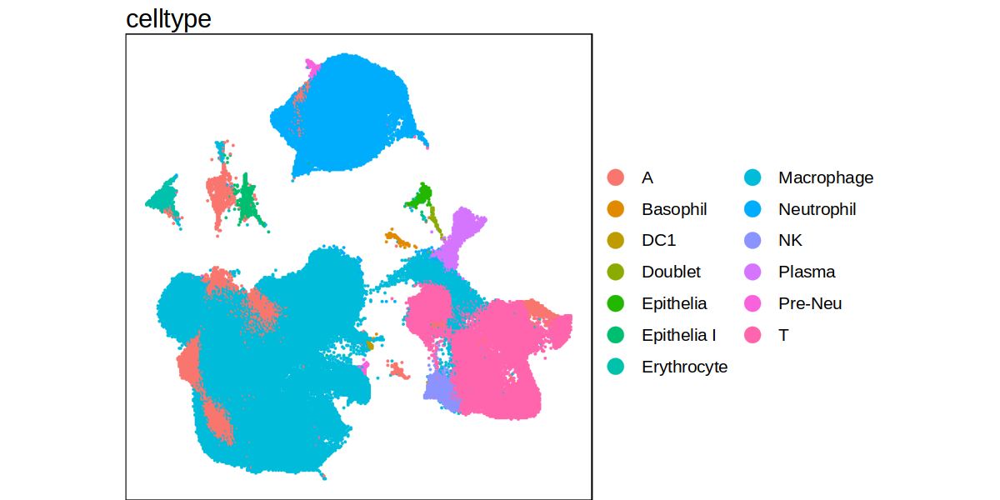

In [189]:
# Refine annotation
options(repr.plot.width=10, repr.plot.height=5)
df$cell_type <- as.character(df$cell_type)
ds$celltype <- as.character(ds$cell_type)
index <- which(df$cell_type == "Macrophage" & df$libsize < 5000)
index
ds$celltype[ds$seurat_clusters %in% index] <- "A"
ds$celltype <- as.factor(ds$celltype)
plot_embedding(ds, "celltype")

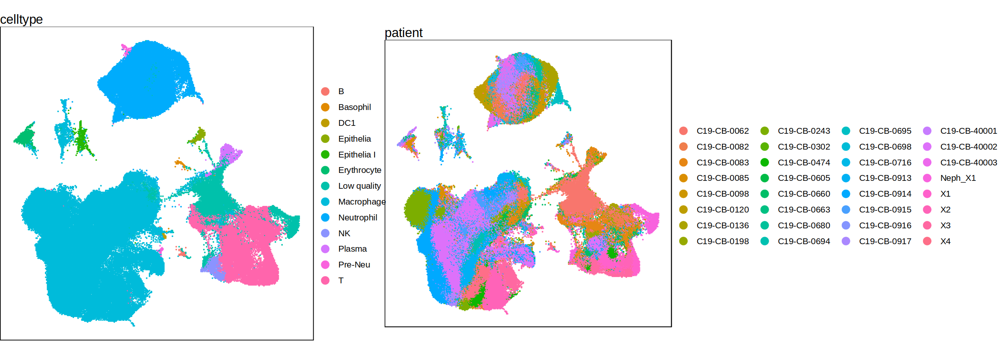

In [78]:
# Refine
ds$celltype <- as.character(ds$cell_type)

ds$patient <- factor(ds$patient)

# Plot
options(repr.plot.width=20, repr.plot.height=7)
cowplot::plot_grid(
    plot_embedding(ds, "celltype", legend.rows = 1),
    plot_embedding(ds, "patient"), rel_widths = c(1,1.6)
    )

[1] "orig.ident"          "nCount_RNA"          "nFeature_RNA"       
 [4] "nCount_HTO"          "nFeature_HTO"        "libname"            
 [7] "libname.1"           "sample"              "cohort"             
[10] "lane"                "index"               "TotalSeq-A"         
[13] "Chemistry"           "run"                 "frozen"             
[16] "freeze_method"       "hto_clust"           "patient"            
[19] "disease"             "dpso"                "type"               
[22] "who_scale"           "severity"            "name"               
[25] "id"                  "cohort.1"            "age"                
[28] "sex"                 "outcome"             "SCoV2_variant"      
[31] "date_PCR"            "Hospital-admission"  "ICU-admission"      
[34] "ICU"                 "Ventilation-start"   "Ventilation-stop"   
[37] "ECMO-start"          "ECMO-stop"           "endpoint_date"      
[40] "libsize"             "ngenes"              "percent.mt"         
[43] "percent.rp"          "qc_cluster"          "quality"            
[46] "RNA_snn_res.3"       "seurat_clusters"     "cell_type"          
[49] "cell_type_certainty" "celltype"            "temp"

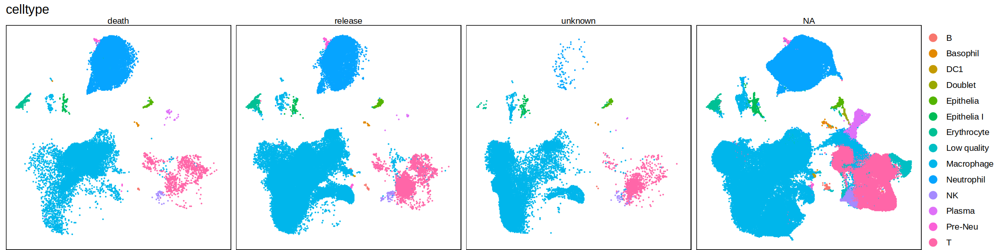

In [66]:
# Plot
names(ds@meta.data)
ds$temp <- factor(ds@meta.data[["outcome"]])
plot_embedding(ds, "celltype", legend.rows = 1, split.by = "outcome")

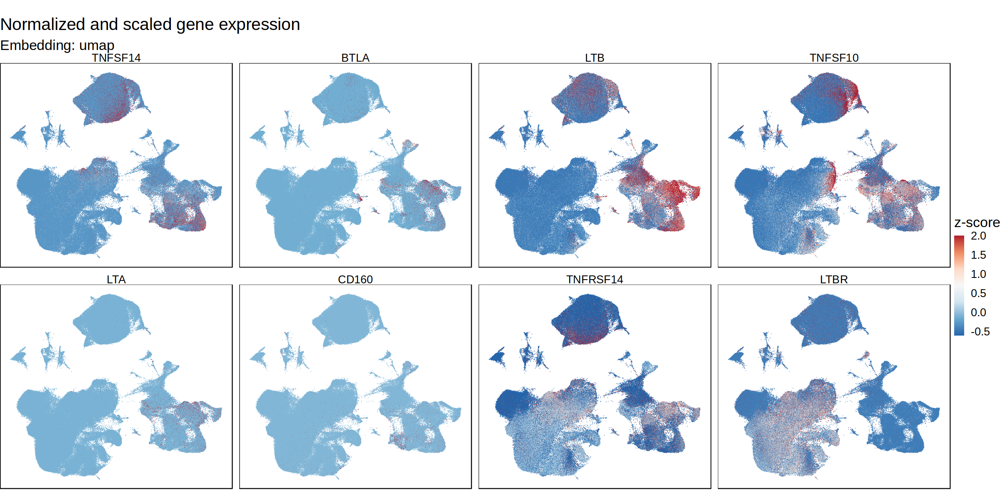

In [24]:
# Malainou - acute phase
options(repr.plot.width=20, repr.plot.height=10)
genes <- markers$malainou$gene
plot_markers_embedding(ds, markers = genes, nrow = 2, pt.stroke = .1, pt.size = .1)
fn <- paste0(plot_dir, "pca-umap_malainou-markers", ".", "png")
ggsave(fn, width = 12, height = 6, bg="white", limitsize = FALSE)

In [190]:
# Save data
saveRDS(ds, out_file)

In [191]:
sessionInfo()

R version 4.3.1 (2023-06-16)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: AlmaLinux 8.5 (Arctic Sphynx)

Matrix products: default
BLAS/LAPACK: /home/odietric/miniconda3/envs/covid19-bal-atlas/lib/libopenblasp-r0.3.24.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=de_DE.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=de_DE.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=de_DE.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=de_DE.UTF-8 LC_IDENTIFICATION=C       

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] readxl_1.4.3            ggplot2_3.4.3           stringr_1.5.0          
[4] SeuratHelper_0.0.0.9000 SeuratObject_4.1.4      Seurat_4.4.0           

loaded via a namespace (and not attached):
  [1